In [3]:
import pandas as pd

import numpy as np
from pandas_profiling import ProfileReport

In [2]:
def read_data(file_path : str):

    df = pd.read_csv(file_path)# we can add the type of delimiter to read correctly the data frame because csv = coma separated values file
    return df
df= read_data("CC GENERAL.csv")
display(df)

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.40,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.00,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.00,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.00,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.00,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8945,C19186,28.493517,1.000000,291.12,0.00,291.12,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,325.594462,48.886365,0.500000,6
8946,C19187,19.183215,1.000000,300.00,0.00,300.00,0.000000,1.000000,0.000000,0.833333,0.000000,0,6,1000.0,275.861322,NaN,0.000000,6
8947,C19188,23.398673,0.833333,144.40,0.00,144.40,0.000000,0.833333,0.000000,0.666667,0.000000,0,5,1000.0,81.270775,82.418369,0.250000,6
8948,C19189,13.457564,0.833333,0.00,0.00,0.00,36.558778,0.000000,0.000000,0.000000,0.166667,2,0,500.0,52.549959,55.755628,0.250000,6


In [4]:
profile = ProfileReport(df)
profile


Summarize dataset:   0%|          | 0/32 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [5]:
df.dropna(axis=0, inplace=True)

In [8]:
newdf = df.drop(['CUST_ID'],axis=1)

In [29]:
new = newdf[["MINIMUM_PAYMENTS","PAYMENTS","PURCHASES_TRX","TENURE"]].copy()
new

,MINIMUM_PAYMENTS,PAYMENTS,PURCHASES_TRX,TENURE
0,139.509787,201.802084,2,12
1,1072.340217,4103.032597,0,12
2,627.284787,622.066742,12,12
4,244.791237,678.334763,1,12
5,2407.246035,1400.057770,8,12
...,...,...,...,...
8943,43.473717,58.644883,1,6
8945,48.886365,325.594462,6,6
8947,82.418369,81.270775,5,6
8948,55.755628,52.549959,0,6


In [30]:
from sklearn.cluster import AgglomerativeClustering 
model=AgglomerativeClustering(n_clusters=3, affinity='euclidean', linkage='complete')
clust_labels=model.fit_predict(new) 

In [31]:
clust_labels

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [32]:
agglomerative=pd.DataFrame(clust_labels)
agglomerative


,0
0,0
1,0
2,0
3,0
4,0
...,...
8631,0
8632,0
8633,0
8634,0


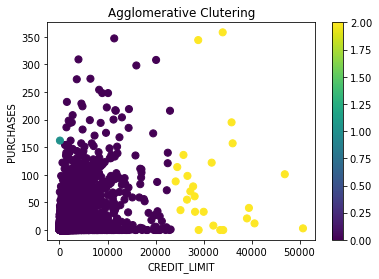

In [49]:
import matplotlib.pyplot as plt
fig =plt.figure()
ax = fig.add_subplot(111)
scatter = ax.scatter (new ['PAYMENTS'] , new ["PURCHASES_TRX"] , c= agglomerative[0], s=50)
ax.set_title("Agglomerative Clutering")
ax.set_xlabel("CREDIT_LIMIT")
ax.set_ylabel("PURCHASES")
plt.colorbar(scatter)


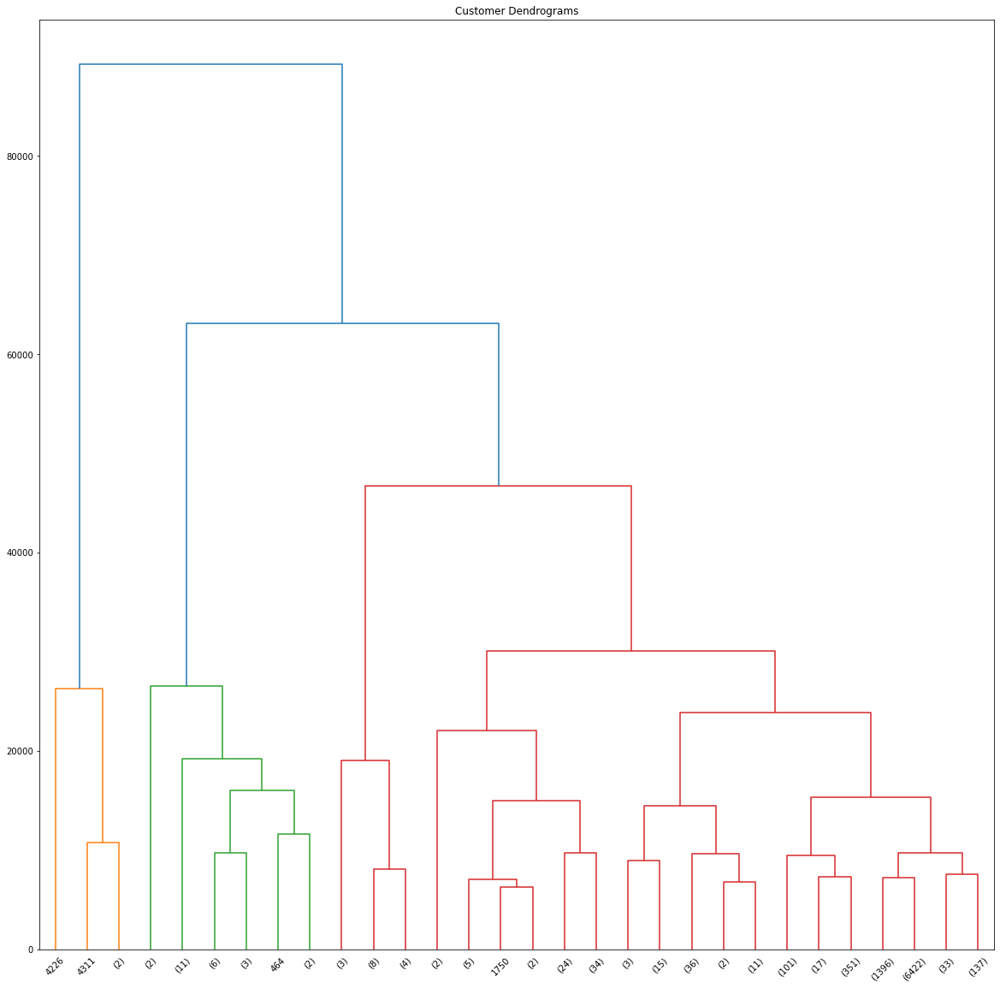

In [40]:
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as shc
plt.figure(figsize=(20,20))
plt.title("Customer Dendrograms")
dend=shc.dendrogram(shc.linkage(new, method="complete"), truncate_mode='lastp' )

In [41]:
from sklearn.cluster import KMeans  
kmeans=KMeans(n_clusters=4, random_state=0)  
kmeans.fit(new)


KMeans(n_clusters=4, random_state=0)

In [43]:
kmeans.predict(new)
print(kmeans.cluster_centers_)


[[6.32056362e+02 1.02885861e+03 1.20447466e+01 1.14949842e+01]
 [2.47339157e+03 2.36036033e+04 6.42361111e+01 1.17916667e+01]
 [2.29292128e+04 1.92091296e+03 1.91071429e+01 1.19107143e+01]
 [1.30210126e+03 6.23292859e+03 3.52800429e+01 1.18122318e+01]]


In [47]:
Sum_of_squared_distances=[]
K = range(1,15)
for k in K:
    km =KMeans(n_clusters=k)
    km.fit (new)
    km=Sum_of_squared_distances.append(km.inertia_)

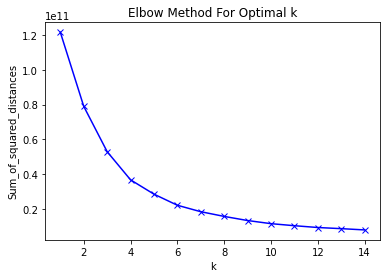

In [48]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

In [ ]:
k maeans is better than agglomerative method